## Spectral data processing for the ANU forest spectrometer from raw instrument output (.bin) to reflectance (.nc) datacubes

## This Notebook outlines a workflow in Python to iterate through subfolders of Spectral data collected by the ANU Forest Spectrometer. Dark-corrected and reordered files are imported (.bin) and processed alongside metadata to reflectance NetCDF (.nc) files. 
## Panel detection is automated, operate this notebook in your base folder that contains scan subfolders.


<br>

### The current code assumes data structure as output by the ANU Forest Spectrometer. This looks like:

```text
Base directory (save and run the Jupyter notebook here)

    Date folder 1 (i.e. 20241002)>
        Hyper >
            Scan1_DRK 
                > skipped
            Scan1_SCN 
                > VNIR .bin file 1
            Scan2_DRK 
                > skipped
            Scan2_SCN 
                > VNIR .bin file 2
            etc
        SWIR > 
            Scan1 
                > SWIR .bin file 1
            Scan2 
                > SWIR .bin file 2
            etc
            
    Date folder 2 (i.e. 20241003>
        Hyper >
            Scan1_DRK 
                > skipped
            Scan1_SCN 
                > VNIR .bin file 1
            Scan2_DRK 
                > skipped
            Scan2_SCN 
                > VNIR .bin file 2
            etc
        SWIR > 
            Scan1 
                > SWIR .bin file 1
            Scan2 
                > SWIR .bin file 2
            etc
    etc
```



### The notebook steps follow:
### *Optional* → Clean matplotlib cache (in case of errors in the first cell)
### Cell 1 → Handles imports and configuration of paths
### Cell 2 → Automated panel detection workflow 
### Cell 3 → Panel-based Reflectance Conversion Pipeline - VNIR & SWIR, append Metadata to Reflectance NetCDF's
### Cell 4 → Panel Detection Recovery Workflow (Manual Reflectance Assignment)
### Cell 5 (optional) → Interactive NetCDF Reflectance Cube Viewer

<br>

### Dependencies:
```text
matplotlib, os, numpy, pandas, pathlib, collections, skimage, scipy.ndimage, IPython.display, importlib, gc, json, ipywidgets
```
## Ensure you operate in a Conda environment that has these dependencies.

In [1]:
# ============================================================
# Processing Cell 1 - Imports and Configuration Paths
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

# Optional: interactive plotting in notebook
%matplotlib inline

# Root path (where the notebook sits)
ROOT_DIR = Path(__file__).parent if "__file__" in locals() else Path.cwd()
print(f"Root directory: {ROOT_DIR}")

# Define which subfolders to look for
VNIR_FOLDER = "Hyper"
SWIR_FOLDER = "SWIR"
METADATA_FOLDER = "MetaData"
PANEL_CAL_FILE = ROOT_DIR / "LARGE_PANEL.txt"

# File name pattern to find (only these .bin files)
VNIR_PATTERN = "reorder_*_U16.bin"
SWIR_PATTERN = "Reorder_*_U16.bin"

# Panel calibration file path
PANEL_CAL_FILE = ROOT_DIR / "LARGE_PANEL.txt"


Root directory: C:\Users\eric\Documents\Spectro_Auto_latest_V


In [2]:
# ============================================================
# optional - cleat matplotlib cache if cell 1 errors:
# ============================================================
## NOTE - #'d out lines, so not to accidentally run. Remove #'s if needed:

# import matplotlib
# import shutil, os
# cache_dir = matplotlib.get_cachedir()
# print(f"Clearing Matplotlib cache at: {cache_dir}")
# shutil.rmtree(cache_dir, ignore_errors=True)


Clearing Matplotlib cache at: C:\Users\eric\.matplotlib


🔧 Using X±5.0% and Y±15.0% expansion for SWIR search region.
ROOT_DIR = C:\Users\eric\Documents\Spectro_Auto_latest_V
Found 2 day folders with both Hyper & SWIR.

📅 20241002: 2 VNIR scan folders (ignoring 2 dark folders)
📅 20241002: pairing 2 VNIR ↔ SWIR scans

🔗 Pair #1: 20241002103354_SCN ↔ 20241002103355
Saved preview → reorder_272_2295_640_U16_preview.png


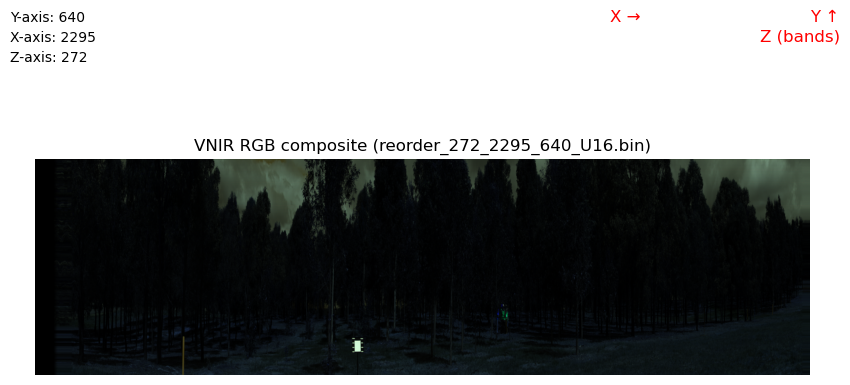

🔍 VNIR detection on reorder_272_2295_640_U16.bin shape=(640, 2295, 272)
Saved panel overlay → reorder_272_2295_640_U16_vnir_panel_grown.png


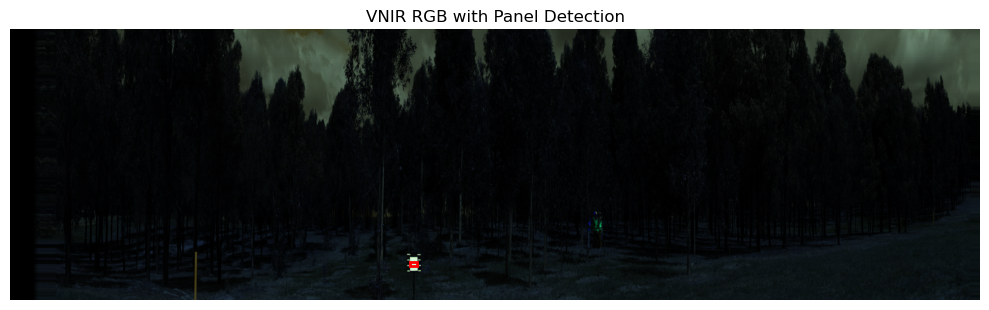

✅ VNIR bbox saved + overlay: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002103354_SCN\reorder_272_2295_640_U16_vnir_panel_grown.png


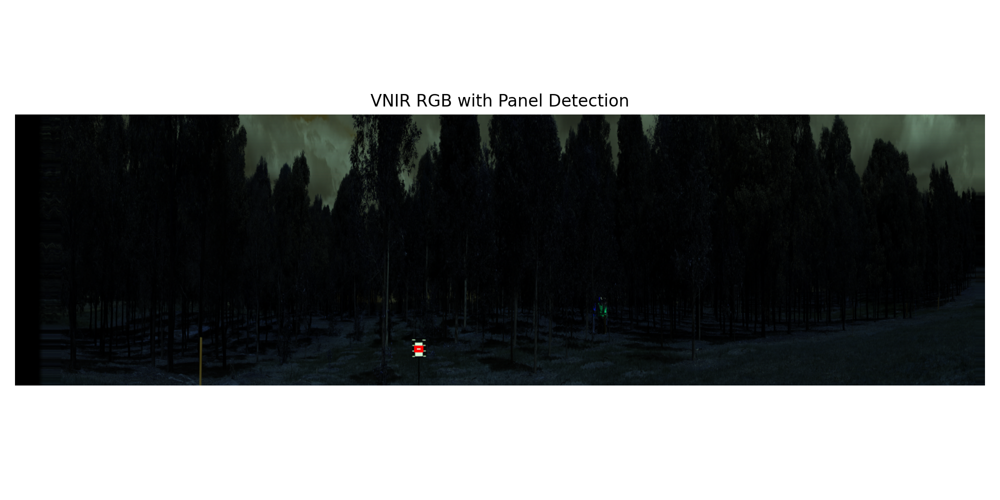

Saved preview → Reorder_288_2334_384_U16_preview.png


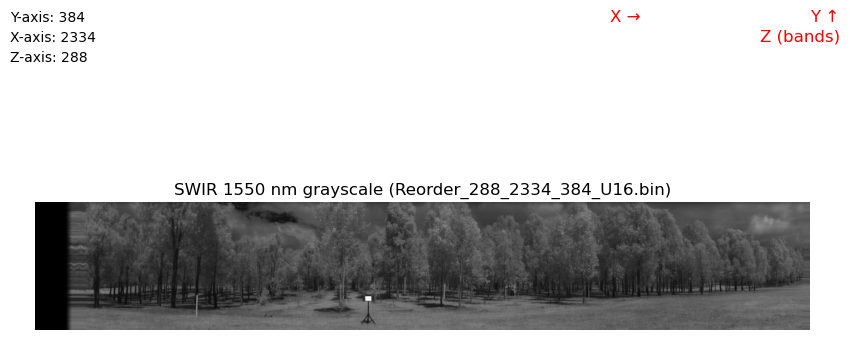

🔍 SWIR local search on Reorder_288_2334_384_U16.bin  shape=(384, 2334, 288)
🔧 Truncated bottom 5.0% (6 rows) from SWIR subcube.
✅ SWIR subcube overlay saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_swir_local_subcube.png
✅ SWIR detection JSON saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_swir_local_subcube.json


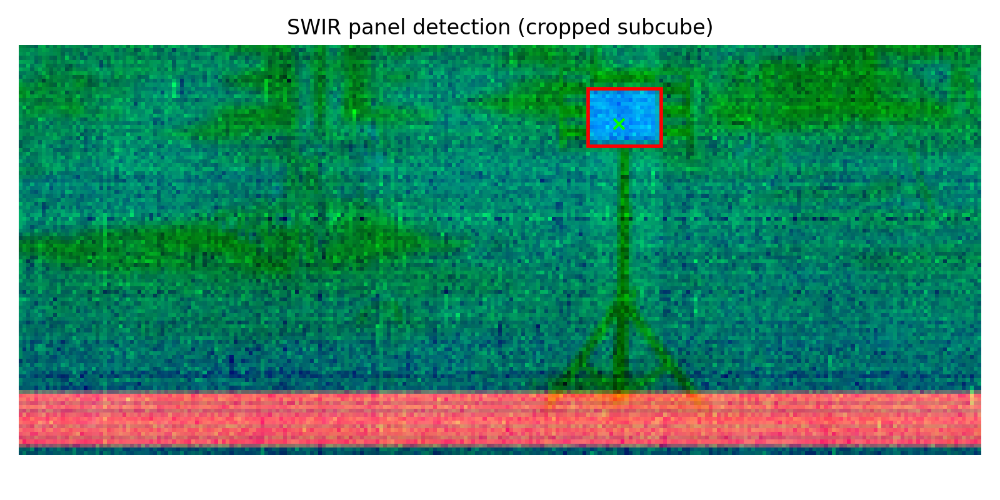

Saved preview → Reorder_288_2334_384_U16_preview.png


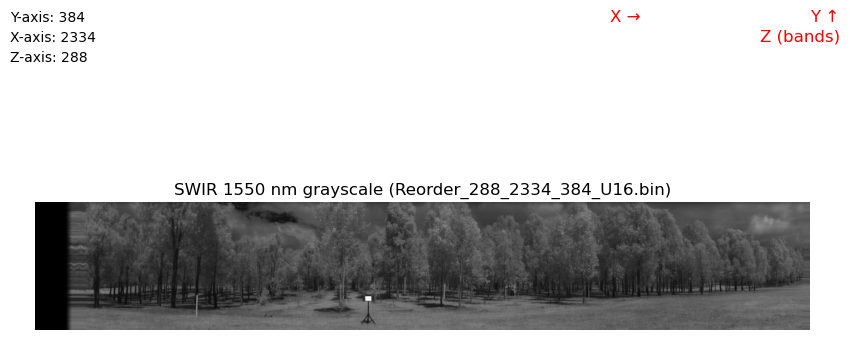

✅ Full SWIR overlay saved (greyscale 1550nm): C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_swir_local_overlay.png


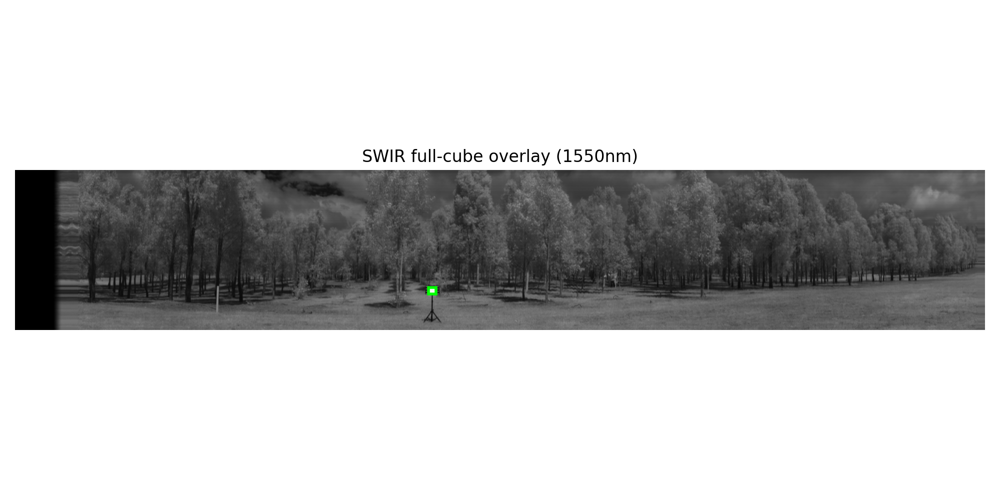

💾 Saved extracted SWIR panel cube: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_panel_cube.npy
💾 VNIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002103354_SCN\reorder_272_2295_640_U16_vnir_bbox.json
💾 SWIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_swir_local_subcube.json

🔗 Pair #2: 20241002113938_SCN ↔ 20241002113938
Saved preview → reorder_272_2125_640_U16_preview.png


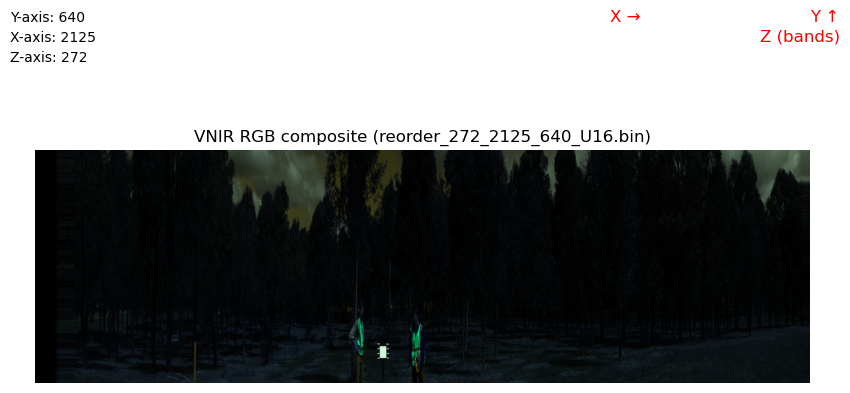

🔍 VNIR detection on reorder_272_2125_640_U16.bin shape=(640, 2125, 272)
Saved panel overlay → reorder_272_2125_640_U16_vnir_panel_grown.png


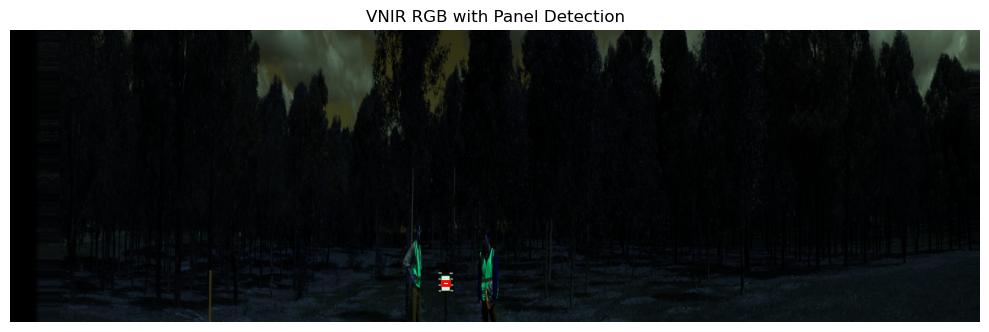

✅ VNIR bbox saved + overlay: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002113938_SCN\reorder_272_2125_640_U16_vnir_panel_grown.png


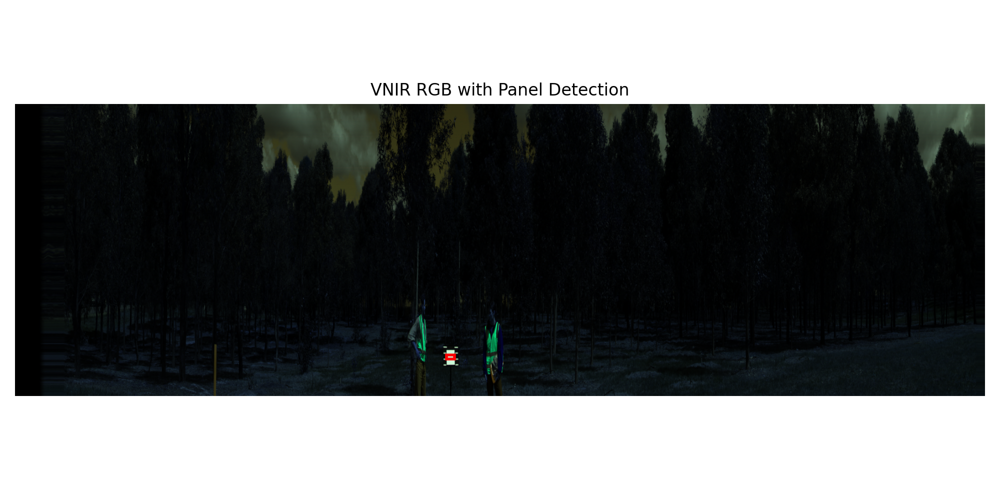

Saved preview → Reorder_288_2154_384_U16_preview.png


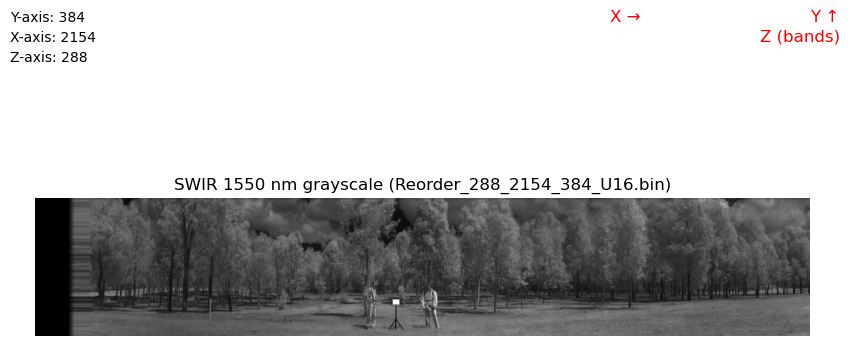

🔍 SWIR local search on Reorder_288_2154_384_U16.bin  shape=(384, 2154, 288)
🔧 Truncated bottom 5.0% (6 rows) from SWIR subcube.
✅ SWIR subcube overlay saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_swir_local_subcube.png
✅ SWIR detection JSON saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_swir_local_subcube.json


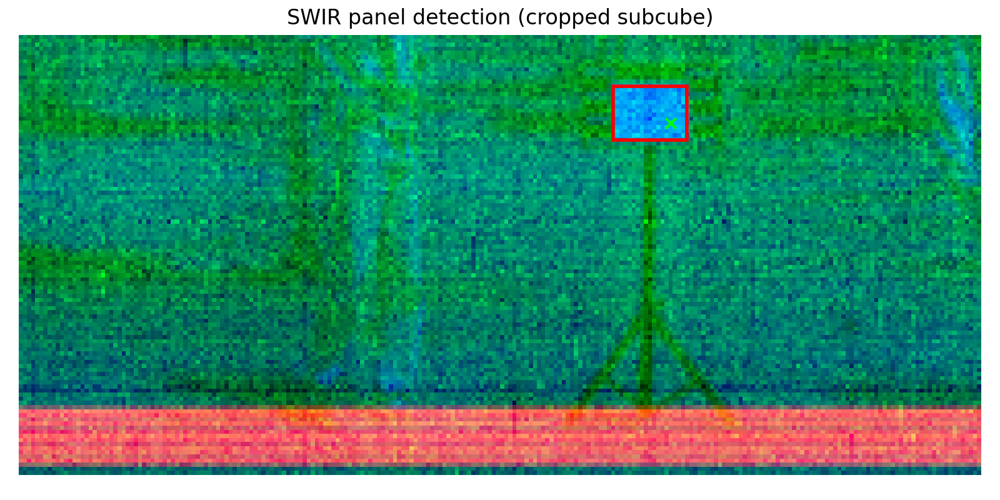

Saved preview → Reorder_288_2154_384_U16_preview.png


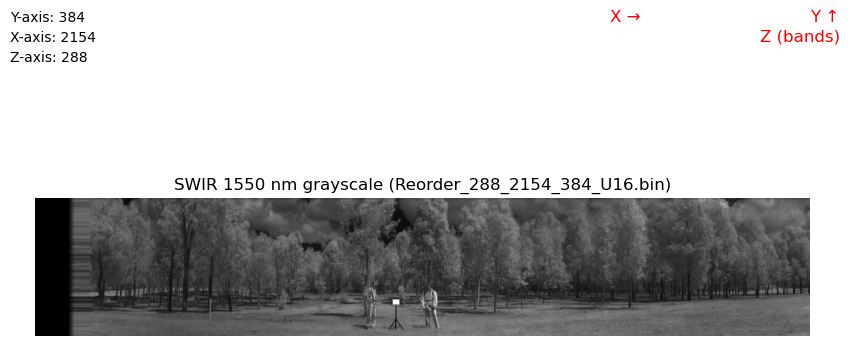

✅ Full SWIR overlay saved (greyscale 1550nm): C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_swir_local_overlay.png


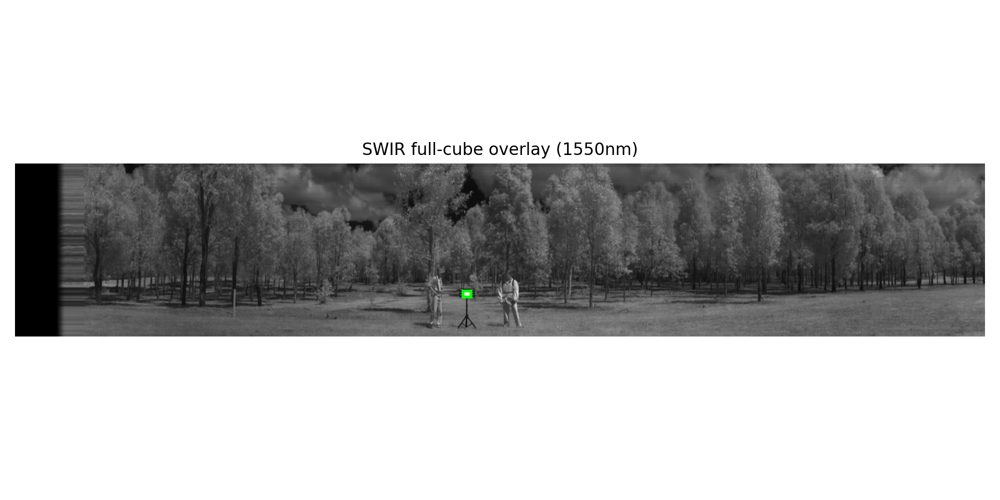

💾 Saved extracted SWIR panel cube: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_panel_cube.npy
💾 VNIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002113938_SCN\reorder_272_2125_640_U16_vnir_bbox.json
💾 SWIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_swir_local_subcube.json

📅 20250313: 2 VNIR scan folders (ignoring 2 dark folders)
📅 20250313: pairing 2 VNIR ↔ SWIR scans

🔗 Pair #1: 20250313110542_SCN ↔ 20250313110542
Saved preview → reorder_272_1037_640_U16_preview.png


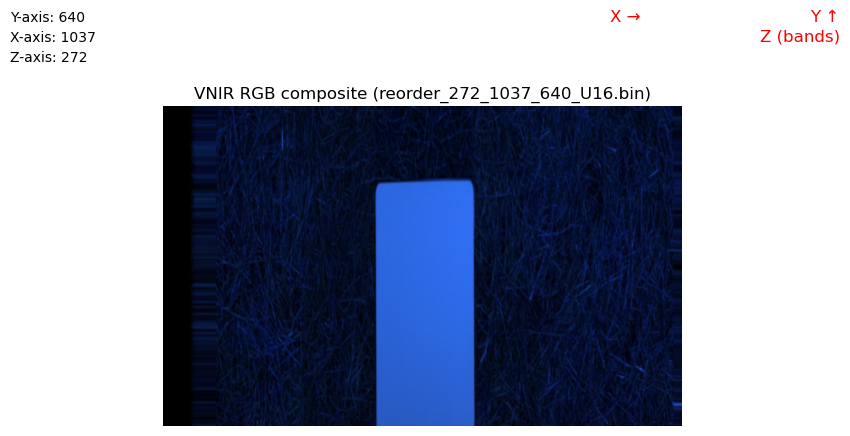

🔍 VNIR detection on reorder_272_1037_640_U16.bin shape=(640, 1037, 272)
Saved panel overlay → reorder_272_1037_640_U16_vnir_panel_grown.png


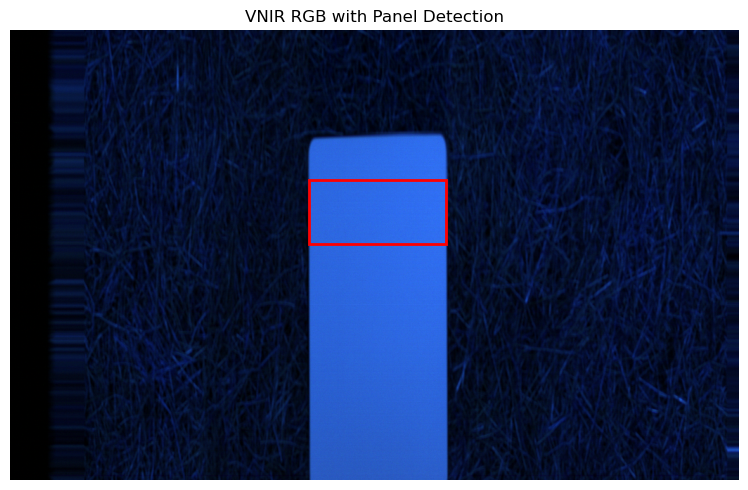

✅ VNIR bbox saved + overlay: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313110542_SCN\reorder_272_1037_640_U16_vnir_panel_grown.png


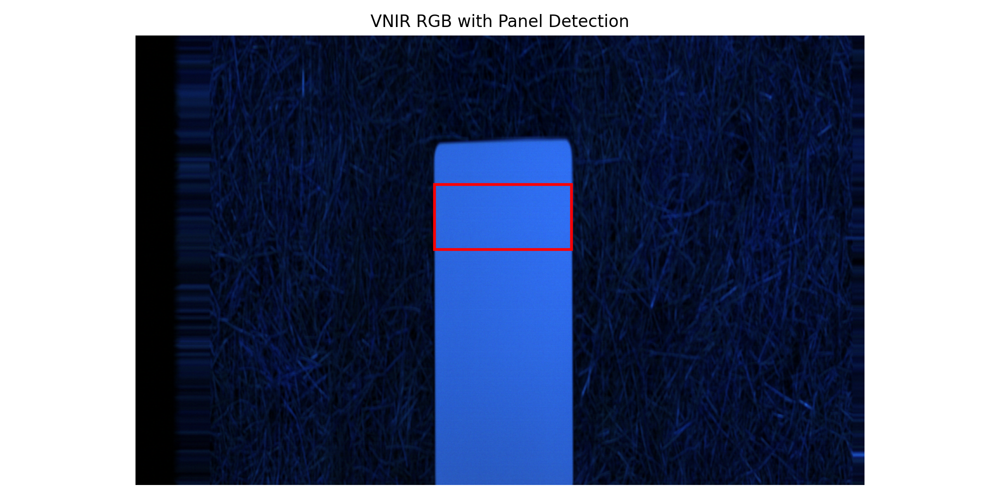

Saved preview → Reorder_288_1075_384_U16_preview.png


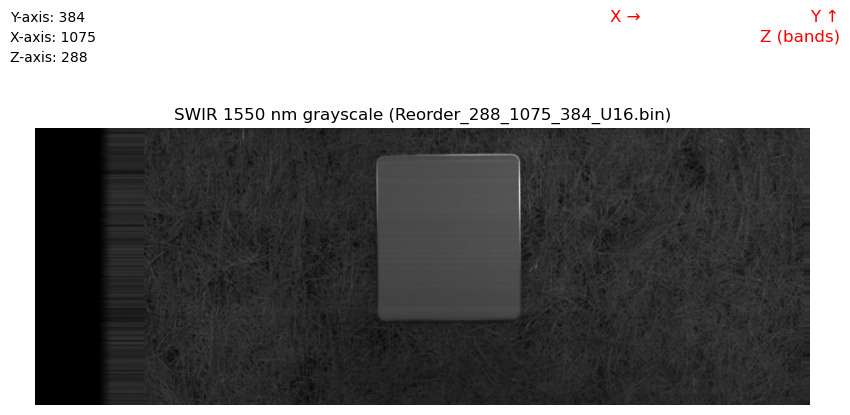

🔍 SWIR local search on Reorder_288_1075_384_U16.bin  shape=(384, 1075, 288)
🔧 Truncated bottom 5.0% (9 rows) from SWIR subcube.
✅ SWIR subcube overlay saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_swir_local_subcube.png
✅ SWIR detection JSON saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_swir_local_subcube.json


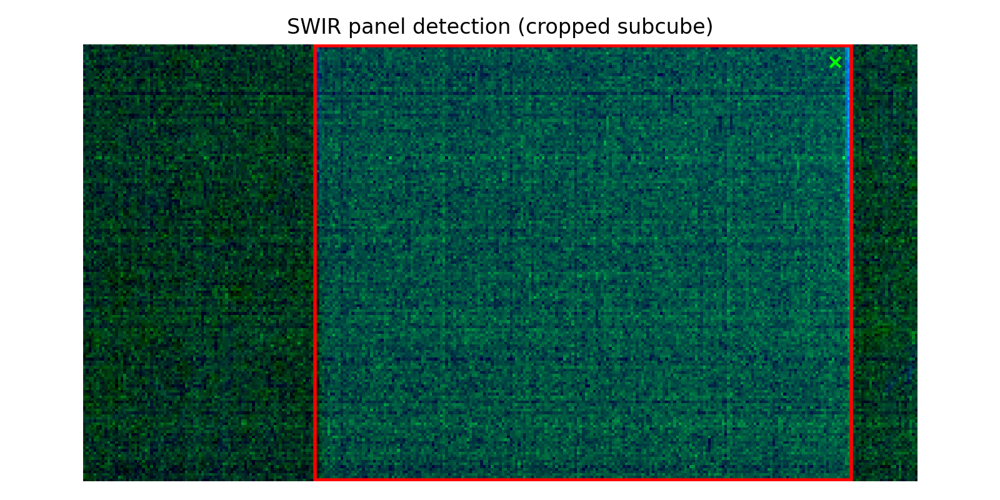

Saved preview → Reorder_288_1075_384_U16_preview.png


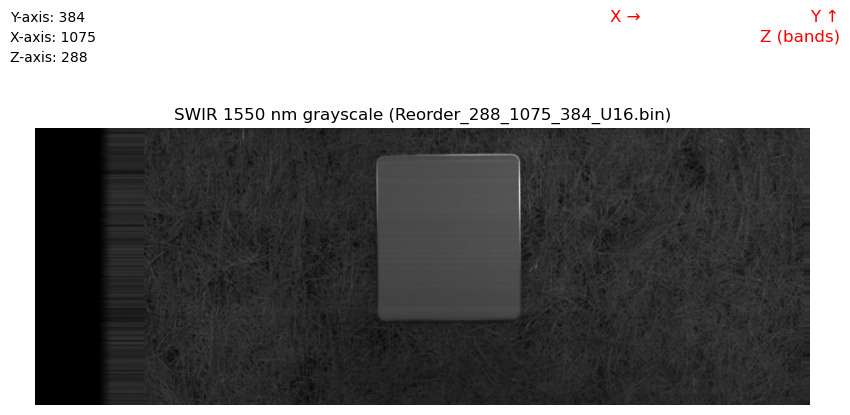

✅ Full SWIR overlay saved (greyscale 1550nm): C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_swir_local_overlay.png


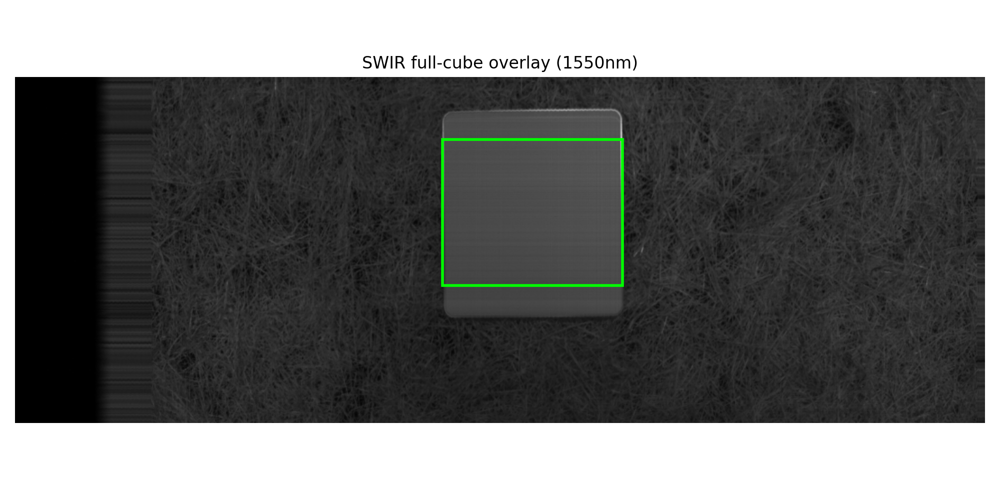

💾 Saved extracted SWIR panel cube: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_panel_cube.npy
💾 VNIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313110542_SCN\reorder_272_1037_640_U16_vnir_bbox.json
💾 SWIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_swir_local_subcube.json

🔗 Pair #2: 20250313113110_SCN ↔ 20250313113110
Saved preview → reorder_272_1037_640_U16_preview.png


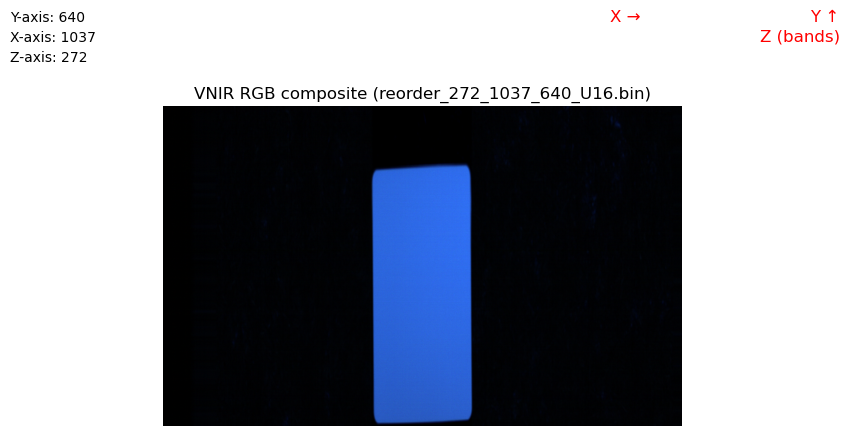

🔍 VNIR detection on reorder_272_1037_640_U16.bin shape=(640, 1037, 272)
Saved panel overlay → reorder_272_1037_640_U16_vnir_panel_grown.png


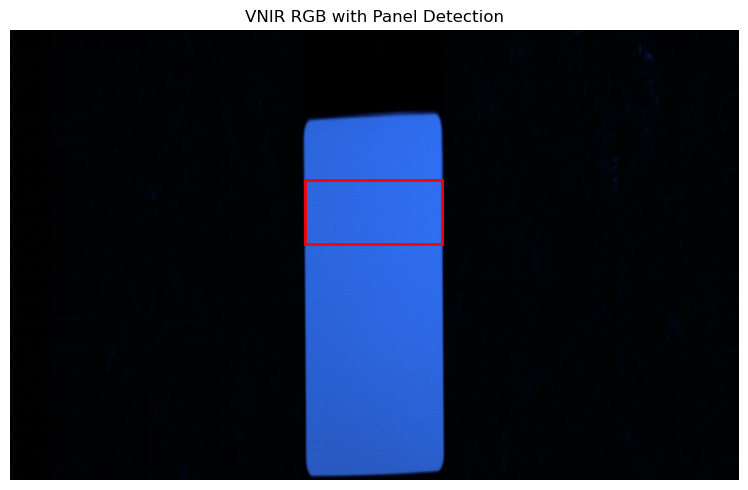

✅ VNIR bbox saved + overlay: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313113110_SCN\reorder_272_1037_640_U16_vnir_panel_grown.png


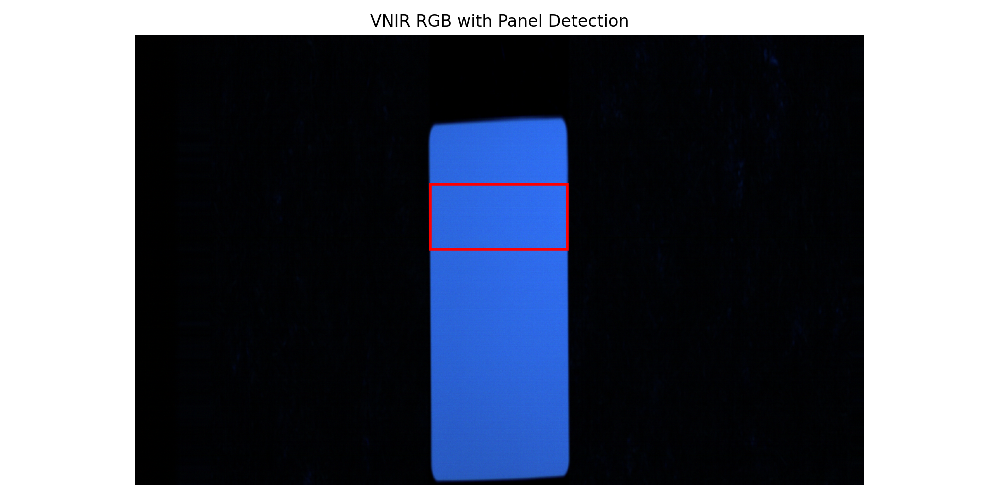

Saved preview → Reorder_288_1076_384_U16_preview.png


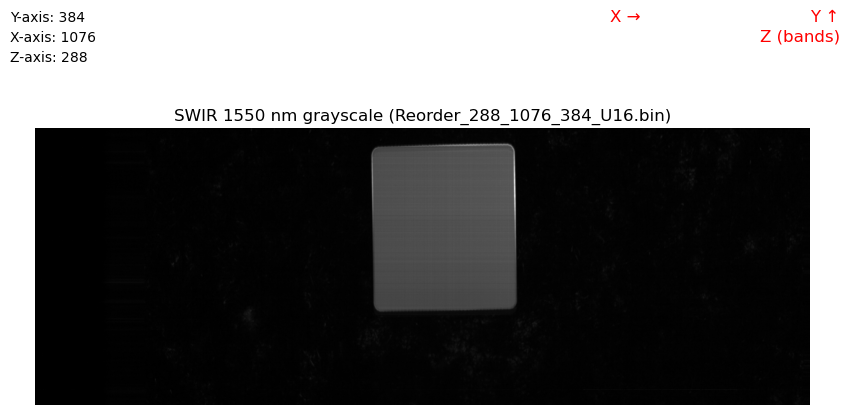

🔍 SWIR local search on Reorder_288_1076_384_U16.bin  shape=(384, 1076, 288)
🔧 Truncated bottom 5.0% (9 rows) from SWIR subcube.
✅ SWIR subcube overlay saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_swir_local_subcube.png
✅ SWIR detection JSON saved: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_swir_local_subcube.json


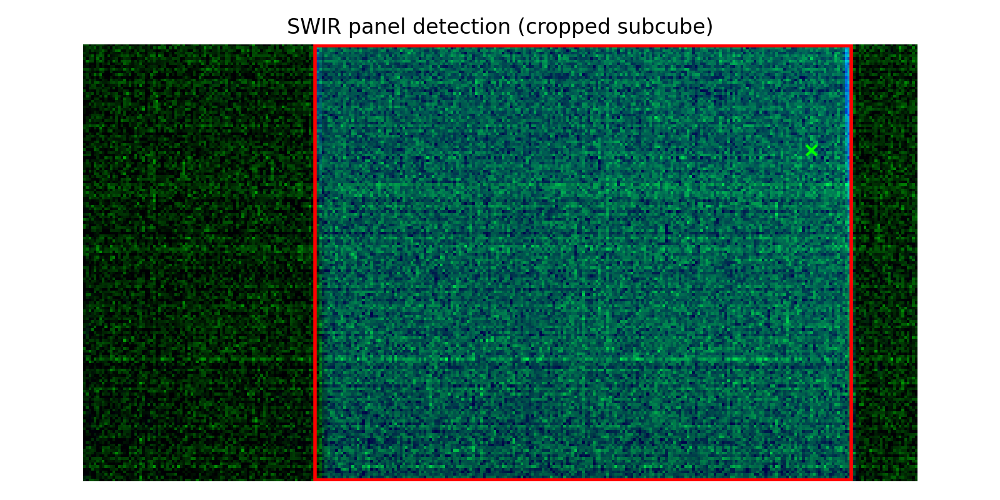

Saved preview → Reorder_288_1076_384_U16_preview.png


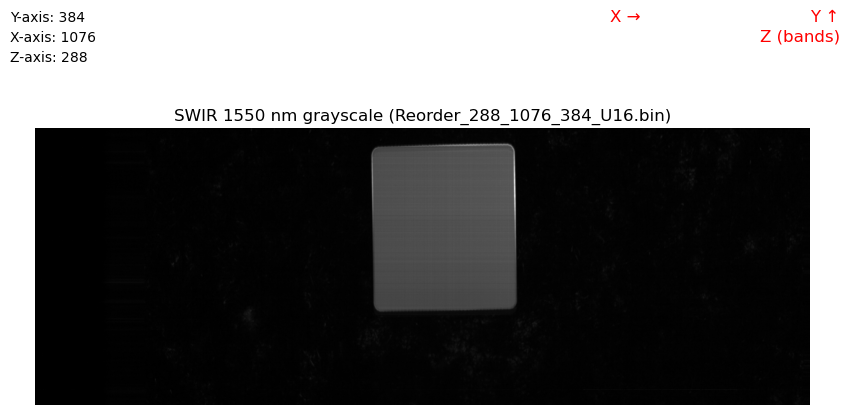

✅ Full SWIR overlay saved (greyscale 1550nm): C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_swir_local_overlay.png


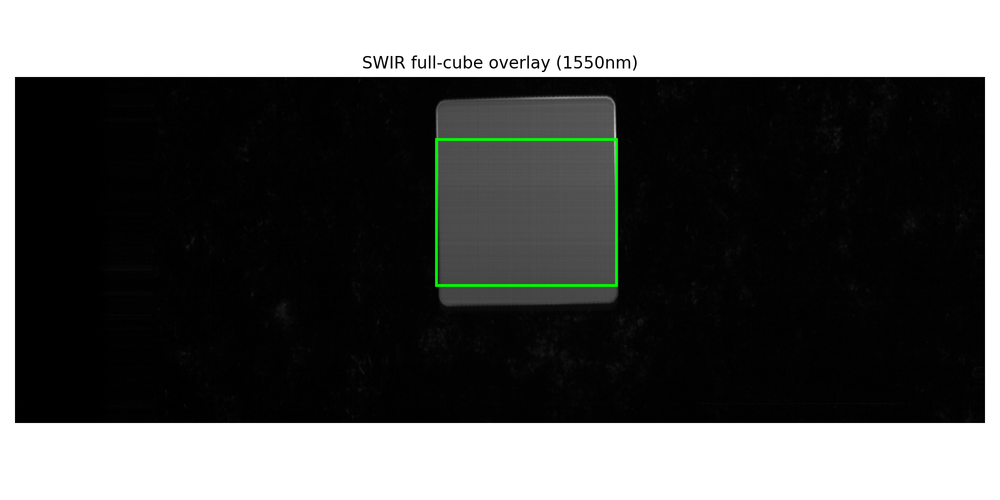

💾 Saved extracted SWIR panel cube: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_panel_cube.npy
💾 VNIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313113110_SCN\reorder_272_1037_640_U16_vnir_bbox.json
💾 SWIR bbox JSON: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_swir_local_subcube.json

✅ All VNIR + SWIR paired detections and full overlays complete.
⚠️ Some detections failed. Review log: C:\Users\eric\Documents\Spectro_Auto_latest_V\pipeline_error_report.txt


In [2]:
# ============================================================
# Processing Cell 2 - panel detection workflow
# ============================================================
## This cell iterates through scan subfolders, working on the instrument output (reordered .bin datacube files).
## The detection is based on brightness, pixel thresholding and for SWIR, a subset region based on the VNIR detection which is more robust.
## Where a detection fails, warning messages are printed and a log is saved to your base folder, "pipeline_error_report.txt" that outlines 
## the failure and path to the file that the code was operating on at the failure, i.e. panel non-detection.
## for a failed detection, if a panel definitely exists in the scan, try relaxing configuration detection parameters.

import importlib, gc, json
from pathlib import Path
from collections import deque
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from skimage import measure, morphology
from scipy.ndimage import uniform_filter
from IPython.display import display, Image
from panel_reflectance_pipeline import (
    import_datacube, visualise_panel_detection, select_informative_swir_wavelengths, robust_adaptive_threshold,
    ensure_python_numbers, normalise_for_detection, advanced_morphological_cleanup, _clip_bbox, map_vnir_to_swir_direct, build_expanded_search_box,
    extract_panel_subcube, visualise_swir_panel_overlay
)

# ============================================================
# CONFIGURATION: VNIR + SWIR detection parameters
# ============================================================
# Use these parameters to control detection tolerances, minimum detection patches for the panel, and bright-pixel detection max candidates.
# The SWIR search box expansion should work as-is, but can be expanded upon if the search region is not finding the SWIR panel.

# --- VNIR panel detection ---
vnir_tolerance_seed_patch = 0.45        # Tolerance for finding uniform bright patch - if 0.45 doesn't find the panel, try increasing this
vnir_tolerance_region_grow = 0.45      # Tolerance for region-growing expansion
vnir_min_patch = 6                      # Minimum patch size to consider as seed
vnir_max_candidates = 5000              # Maximum candidate pixels to test

# --- SWIR panel detection ---
swir_tolerance_seed_patch = 0.3        # Tolerance for finding uniform bright patch in SWIR subcube, lower = stricter, less inclusive
swir_tolerance_region_grow = 0.3       # Tolerance for region-growing expansion in SWIR subcube, lower = stricter, less inclusive
swir_min_patch = 10                     # Minimum patch size for candidate detection
swir_max_candidates = 2000              # Maximum pixels to test for seed

# --- SWIR search box expansion ---
percent_increase_SWIR_search_x = 0.05  # ±5% horizontal expansion
percent_increase_SWIR_search_y = 0.15  # ±15% vertical expansion
print(f"🔧 Using X±{percent_increase_SWIR_search_x*100:.1f}% and "
      f"Y±{percent_increase_SWIR_search_y*100:.1f}% expansion for SWIR search region.")


# ============================================================
# Error logging utility
# ============================================================

def log_pipeline_warning(message, file_path=None):
    """
    Append a warning or failure message to pipeline_error_report.txt in the root folder.
    Each entry is timestamped and includes the file path if provided.
    """
    from datetime import datetime
    ROOT_DIR = Path.cwd()
    log_file = ROOT_DIR / "pipeline_error_report.txt"

    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    entry = f"[{timestamp}] WARNING: {message}"
    if file_path:
        entry += f"\n   File: {file_path}"
    entry += "\n"

    # Append message safely
    with open(log_file, "a") as f:
        f.write(entry)


# ============================================================
# VNIR detection functions
# ============================================================
# This sections uses brightness detection to find the reflectance panel in the VNIR datacubes, for all sub-folders within the root directory.

def find_uniform_bright_patch_priority_VNIR(cube):
    Y, X, B = cube.shape
    brightness_map = cube.mean(axis=2)
    pixels_yx = np.array(np.unravel_index(np.argsort(-brightness_map.ravel()), brightness_map.shape)).T
    checked = set()
    for y0, x0 in pixels_yx[:vnir_max_candidates]:
        if (y0, x0) in checked: continue
        y_start = max(0, y0 - vnir_min_patch//2)
        x_start = max(0, x0 - vnir_min_patch//2)
        y_end = min(Y, y_start + vnir_min_patch)
        x_end = min(X, x_start + vnir_min_patch)
        region_cube = cube[y_start:y_end, x_start:x_end, :]
        if region_cube.shape[0] < vnir_min_patch or region_cube.shape[1] < vnir_min_patch:
            checked.add((y0, x0)); continue
        central_pixel = region_cube[vnir_min_patch//2, vnir_min_patch//2, :]
        lower_bound = central_pixel * (1 - vnir_tolerance_seed_patch)
        upper_bound = central_pixel * (1 + vnir_tolerance_seed_patch)
        uniform_mask = np.all((region_cube >= lower_bound) & (region_cube <= upper_bound), axis=2)
        if np.all(uniform_mask):
            return (x0, y0)
        checked.add((y0, x0))
    return None

def grow_panel_from_seed_VNIR(cube, seed_pixel):
    Y, X, B = cube.shape
    mask = np.zeros((Y,X), dtype=bool)
    visited = np.zeros((Y,X), dtype=bool)
    sx, sy = seed_pixel
    region_vals = [cube[sy, sx, :]]
    queue = deque([(sy, sx)])

    # initial region mean 
    region_mean = cube[sy, sx, :].astype(np.float32) 
    queue = deque([(sy, sx)]) 
    mask[sy, sx] = True 
    visited[sy, sx] = True
    
    while queue: 
        y, x = queue.popleft() 
        for ny in range(max(0, y - 1), min(Y, y + 2)): 
            for nx in range(max(0, x - 1), min(X, x + 2)): 
                if visited[ny, nx]: 
                    continue 
                visited[ny, nx] = True 
                pix = cube[ny, nx, :].astype(np.float32) 
                within = np.all((pix >= region_mean * (1 - vnir_tolerance_region_grow)) & (pix <= region_mean * (1 + vnir_tolerance_region_grow))) 
                if within: 
                    mask[ny, nx] = True 
                    queue.append((ny, nx)) 
                    # adaptive mean update (EMA) to allow gradual drift 
                    region_mean = 0.98 * region_mean + 0.02 * pix
    return mask

def run_vnir_detection(vnir_file):
    cube, wavelengths = import_datacube(vnir_file, verify_orientation=True)
    print(f"🔍 VNIR detection on {vnir_file.name} shape={cube.shape}")
    seed = find_uniform_bright_patch_priority_VNIR(cube)
    if seed is None:
        print("⚠️ No suitable bright patch found for VNIR.")
        log_pipeline_warning("No suitable bright patch found for VNIR.", vnir_file)
        return None
        return None
    mask = grow_panel_from_seed_VNIR(cube, seed)
    ys, xs = np.where(mask)
    if len(xs)==0 or len(ys)==0:
        print("⚠️ Panel region failed to expand.")
        log_pipeline_warning("Panel region failed to expand in VNIR detection.", vnir_file)
        return None
        return None
    bbox = (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))
    save_path = vnir_file.parent / f"{vnir_file.stem}_vnir_panel_grown.png"
    visualise_panel_detection(cube, wavelengths, bbox, save_path=save_path, sensor_type="VNIR")
    json_payload = {"file": str(vnir_file), "bbox": tuple(map(int,bbox)), "shape": tuple(map(int,cube.shape))}
    json_path = vnir_file.parent / f"{vnir_file.stem}_vnir_bbox.json"
    with open(json_path, "w") as f: json.dump(json_payload, f, indent=2)
    print(f"✅ VNIR bbox saved + overlay: {save_path}")
    return bbox, cube.shape, save_path, json_path


# ============================================================
# SWIR detection functions
# ============================================================
# This part uses the known VNIR detection region, to create a search box sub-region in the SWIR datacube to detect and box the reflectance panel

def run_swir_local_search_from_vnir(
    swir_file,
    vnir_bbox,
    vnir_shape,
    pct_expand_x=None,
    pct_expand_y=None,
    informative_bands=None,
    percentile=95,
    min_area=10,
    max_area_ratio=0.3,
    debug=True
):
    """
    SWIR panel detection guided by VNIR panel location.
    Uses VNIR-derived search box to crop SWIR cube and detect panel
    using robust patch-based selection + region-growing.

    Returns:
        detected_bbox_full : tuple of ints (x1, y1, x2, y2) in full SWIR cube coordinates
        save_png : Path to PNG overlay
        json_path : Path to JSON payload
        payload : dict of detection info
    """

    if pct_expand_x is None:
        pct_expand_x = percent_increase_SWIR_search_x
    if pct_expand_y is None:
        pct_expand_y = percent_increase_SWIR_search_y

    # --- Load SWIR cube ---
    cube, wavelengths = import_datacube(swir_file, verify_orientation=True)
    Y, X, B = cube.shape
    if debug:
        print(f"🔍 SWIR local search on {swir_file.name}  shape={cube.shape}")

    # --- Map VNIR bbox -> SWIR coordinates and expand ---
    direct_bbox = map_vnir_to_swir_direct(vnir_bbox, vnir_shape, cube.shape)
    search_box = build_expanded_search_box(direct_bbox, cube.shape,
                                           pct_x=pct_expand_x, pct_y=pct_expand_y)
    x1, y1, x2, y2 = search_box
    swir_subcube = cube[y1:y2+1, x1:x2+1, :]

    if swir_subcube.size == 0:
        print("⚠️ SWIR subcube is empty. Returning direct bbox.")
        log_pipeline_warning("SWIR subcube empty after VNIR-based mapping.", swir_file)
        return direct_bbox, None, None, {"error": "empty_subcube"}

    # --- Optional: truncate bottom 5% of subcube ---
    truncate_pct_y = 0.05
    n_trunc = int(round(swir_subcube.shape[0] * truncate_pct_y))
    swir_subcube_proc = swir_subcube[:-n_trunc, :, :] if n_trunc > 0 else swir_subcube.copy()
    if debug and n_trunc > 0:
        print(f"🔧 Truncated bottom {truncate_pct_y*100:.1f}% ({n_trunc} rows) from SWIR subcube.")

    # --- Select informative bands ---
    if informative_bands is None:
        informative_bands = select_informative_swir_wavelengths(wavelengths)

    # --- Build composite ---
    comp_sub = np.stack([swir_subcube_proc[:, :, i].astype(np.float32) for i in informative_bands], axis=-1)
    brightness = comp_sub.mean(axis=2)
    brightness_norm = normalise_for_detection(brightness)

    # --------------------------
    # Helper: find uniform bright patch (seed)
    # --------------------------
    def find_uniform_bright_patch(comp_region):
        Yc, Xc = comp_region.shape
        pixels_yx = np.array(np.unravel_index(np.argsort(-comp_region.ravel()), comp_region.shape)).T
        checked = set()
        for y0, x0 in pixels_yx[:swir_max_candidates]:
            if (y0, x0) in checked: continue
            y_start = max(0, y0 - swir_min_patch//2)
            x_start = max(0, x0 - swir_min_patch//2)
            y_end = min(Yc, y_start + swir_min_patch)
            x_end = min(Xc, x_start + swir_min_patch)
            patch = comp_region[y_start:y_end, x_start:x_end]
            if patch.shape[0] < swir_min_patch or patch.shape[1] < swir_min_patch:
                checked.add((y0, x0))
                continue
            central_val = patch[swir_min_patch//2, swir_min_patch//2]
            if np.all(np.abs(patch - central_val) <= swir_tolerance_seed_patch):
                return (x0, y0)
            checked.add((y0, x0))
        return None

    # --------------------------
    # Helper: region-growing from seed
    # --------------------------
    def grow_panel_from_seed(comp_region, seed_pixel):
        Yc, Xc = comp_region.shape
        mask = np.zeros((Yc, Xc), dtype=bool)
        visited = np.zeros((Yc, Xc), dtype=bool)
        sx, sy = seed_pixel
        region_vals = [comp_region[sy, sx]]
        queue = deque([(sy, sx)])
        while queue:
            y, x = queue.popleft()
            if visited[y, x]: continue
            visited[y, x] = True
            pixel_val = comp_region[y, x]
            mean_val = np.mean(region_vals)
            if np.abs(pixel_val - mean_val) <= swir_tolerance_region_grow:
                mask[y, x] = True
                region_vals.append(pixel_val)
                for ny in range(max(0,y-1), min(Yc,y+2)):
                    for nx in range(max(0,x-1), min(Xc,x+2)):
                        if not visited[ny, nx] and not mask[ny, nx]:
                            queue.append((ny, nx))
        return mask

    # --- Step 4: Find seed and grow panel ---
    seed = find_uniform_bright_patch(brightness_norm)
    if seed is None:
        print("⚠️ SWIR detection failed; no uniform bright patch found.")
        log_pipeline_warning("SWIR detection failed: no uniform bright patch found.", swir_file)
        detected_bbox_sub = (0,0,0,0)
        mask = np.zeros_like(brightness_norm, dtype=bool)
    else:
        mask = grow_panel_from_seed(brightness_norm, seed)
        ys, xs = np.where(mask)
        if len(xs)==0 or len(ys)==0:
            detected_bbox_sub = (0,0,0,0)
        else:
            detected_bbox_sub = (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))

    # --- Map bbox back to full SWIR coordinates ---
    x1_f, y1_f = x1 + detected_bbox_sub[0], y1 + detected_bbox_sub[1]
    x2_f, y2_f = x1 + detected_bbox_sub[2], y1 + detected_bbox_sub[3]
    detected_bbox_full = _clip_bbox((x1_f, y1_f, x2_f, y2_f), Y, X)

    # --- Save overlay PNG ---
    save_png = swir_file.parent / f"{swir_file.stem}_swir_local_subcube.png"
    fig, ax = plt.subplots(figsize=(8,4))
    rgb_disp = comp_sub[:, :, :3].copy()
    for k in range(3):
        mn, mx = np.nanmin(rgb_disp[:,:,k]), np.nanmax(rgb_disp[:,:,k])
        rgb_disp[:,:,k] = (rgb_disp[:,:,k]-mn)/(mx-mn+1e-9) if mx-mn>1e-6 else np.zeros_like(rgb_disp[:,:,k])
    ax.imshow(np.clip(rgb_disp,0,1))
    x1s, y1s, x2s, y2s = detected_bbox_sub
    ax.add_patch(Rectangle((x1s, y1s), x2s-x1s, y2s-y1s, edgecolor='red', facecolor='none', linewidth=2))
    if seed is not None:
        ax.scatter([seed[0]], [seed[1]], marker='x', c='lime')
    ax.set_title("SWIR panel detection (cropped subcube)")
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(save_png, dpi=200)
    plt.close(fig)
    if debug:
        print(f"✅ SWIR subcube overlay saved: {save_png}")

    # --- Save JSON payload ---
    payload = {
        "file": str(swir_file),
        "mapped_direct_bbox": direct_bbox,
        "search_box": search_box,
        "detected_bbox": detected_bbox_full,
        "vnir_bbox": vnir_bbox,
        "vnir_shape": vnir_shape,
        "swir_shape": cube.shape,
        "informative_bands": informative_bands,
        "seed_subcube": seed
    }
    payload_safe = ensure_python_numbers(payload)
    json_path = save_png.with_suffix(".json")
    with open(json_path, "w") as f:
        json.dump(payload_safe, f, indent=2)
    if debug:
        print(f"✅ SWIR detection JSON saved: {json_path}")

    return detected_bbox_full, save_png, json_path, payload_safe
    
# ============================================================
# Main VNIR ↔ SWIR pairing loop (robust folder name checking)
# ============================================================

ROOT_DIR = Path.cwd() if 'ROOT_DIR' not in globals() else Path(ROOT_DIR)
print(f"ROOT_DIR = {ROOT_DIR}")

day_folders = sorted([
    p for p in ROOT_DIR.iterdir()
    if p.is_dir() and (p / "Hyper").exists() and (p / "SWIR").exists()
])
print(f"Found {len(day_folders)} day folders with both Hyper & SWIR.")

# Loop through all day folders
for day in day_folders:
    hyper_folders = [p for p in (day / "Hyper").iterdir() if p.is_dir()]
    swir_folders = [p for p in (day / "SWIR").iterdir() if p.is_dir()]

    # --- Explicit folder filtering ---
    vnir_dark_folders = [p for p in hyper_folders if p.name.upper().endswith("_DRK")]
    vnir_scan_folders = [p for p in hyper_folders if p.name.upper().endswith("_SCN")]

    if not vnir_scan_folders:
        print(f"⚠️ No VNIR scan folders found in {day.name}, skipping day.")
        continue
    if not swir_folders:
        print(f"⚠️ No SWIR scan folders found in {day.name}, skipping day.")
        continue

    # --- Sort folders to maintain consistent pairing ---
    vnir_scan_folders = sorted(vnir_scan_folders)
    swir_folders = sorted(swir_folders)
    n_pairs = min(len(vnir_scan_folders), len(swir_folders))

    print(f"\n📅 {day.name}: {len(vnir_scan_folders)} VNIR scan folders (ignoring {len(vnir_dark_folders)} dark folders)")
    print(f"📅 {day.name}: pairing {n_pairs} VNIR ↔ SWIR scans")

    for i in range(n_pairs):
        vnir_scan = vnir_scan_folders[i]
        swir_scan = swir_folders[i]
        print(f"\n🔗 Pair #{i+1}: {vnir_scan.name} ↔ {swir_scan.name}")

        vnir_files = sorted(vnir_scan.glob("reorder_*_U16.bin"))
        swir_files = sorted(swir_scan.glob("Reorder_*_U16.bin"))
        if not vnir_files or not swir_files:
            print("  ⚠️ Missing VNIR or SWIR cube; skipping this pair.")
            log_pipeline_warning("Missing VNIR or SWIR cube in scan pair.", day)
            continue

        vnir_file = vnir_files[0]
        swir_file = swir_files[0]

        # --- VNIR detection ---
        vnir_result = run_vnir_detection(vnir_file)
        if not vnir_result:
            print("  ⚠️ VNIR detection failed; skipping SWIR.")
            log_pipeline_warning("VNIR detection failed; skipping SWIR.", vnir_file)
            continue

        vnir_bbox, vnir_shape, vnir_overlay_png, vnir_json = vnir_result
        display(Image(filename=vnir_overlay_png))

        # --- SWIR local search guided by VNIR bbox ---
        swir_result = run_swir_local_search_from_vnir(
            swir_file,
            vnir_bbox,
            vnir_shape,
            pct_expand_x=percent_increase_SWIR_search_x,
            pct_expand_y=percent_increase_SWIR_search_y,
            debug=True
        )
        if not swir_result:
            print("  ⚠️ SWIR detection failed for this pair.")
            log_pipeline_warning("SWIR detection failed for this pair.", swir_file)
            continue

        detected_bbox_full, swir_overlay_png, swir_json, payload = swir_result

        # --- Display SWIR cropped subcube overlay ---
        display(Image(filename=swir_overlay_png))

        # --- Full-cube overlay + extraction ---
        cube_full, wavelengths_full = import_datacube(swir_file)
        panel_cube = extract_panel_subcube(cube_full, detected_bbox_full)
        overlay_path = swir_file.parent / f"{swir_file.stem}_swir_local_overlay.png"
        visualise_swir_panel_overlay(cube_full, detected_bbox_full, wavelengths_full, overlay_path)
        
        display(Image(filename=overlay_path))
        
        panel_save_path = swir_file.parent / f"{swir_file.stem}_panel_cube.npy"
        np.save(panel_save_path, panel_cube)

        print(f"💾 Saved extracted SWIR panel cube: {panel_save_path}")
        print(f"💾 VNIR bbox JSON: {vnir_json}")
        print(f"💾 SWIR bbox JSON: {swir_json}")

print("\n✅ All VNIR + SWIR paired detections and full overlays complete.")

log_path = Path.cwd() / "pipeline_error_report.txt"
if log_path.exists():
    print(f"⚠️ Some detections failed. Review log: {log_path}")
else:
    print("🎉 All detections succeeded — no warnings logged.")
#end

✅ Loaded panel calibration: LARGE_PANEL.txt (2251 wavelengths)
Found 2 day folders to process.

📅 Processing Day Folder: 20241002

🎨 VNIR Scene: 20241002103354_SCN — Arboretum_test (10:26:31)
Preparing to write reorder_272_2295_640_U16_reflectance.nc (shape=(640, 2295, 272))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002103354_SCN\reorder_272_2295_640_U16_reflectance.nc (scaled int int16, compressed)


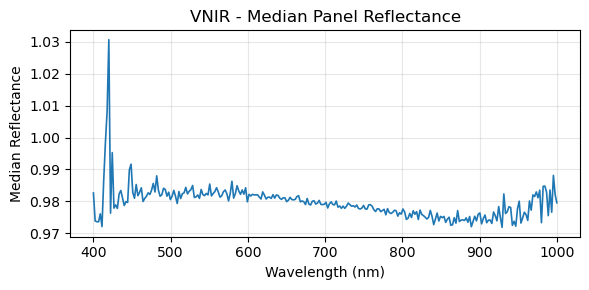

✅ Saved median panel reflectance CSV: reorder_272_2295_640_U16_median_panel_reflectance.csv

🎨 VNIR Scene: 20241002113938_SCN — Arboretum_test2 (10:33:55)
Preparing to write reorder_272_2125_640_U16_reflectance.nc (shape=(640, 2125, 272))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002113938_SCN\reorder_272_2125_640_U16_reflectance.nc (scaled int int16, compressed)


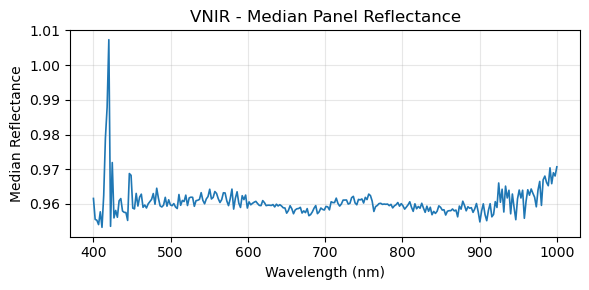

✅ Saved median panel reflectance CSV: reorder_272_2125_640_U16_median_panel_reflectance.csv

🎨 SWIR Scene: 20241002103355 — Arboretum_test (10:26:31)
Preparing to write Reorder_288_2334_384_U16_reflectance.nc (shape=(384, 2334, 288))


C:\Users\eric\AppData\Local\Temp\ipykernel_18892\2465184661.py:191: RuntimeWarning: invalid value encountered in cast
  scaled = np.round(reflectance_cube * scale_factor).astype(np.int16)


✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_reflectance.nc (scaled int int16, compressed)


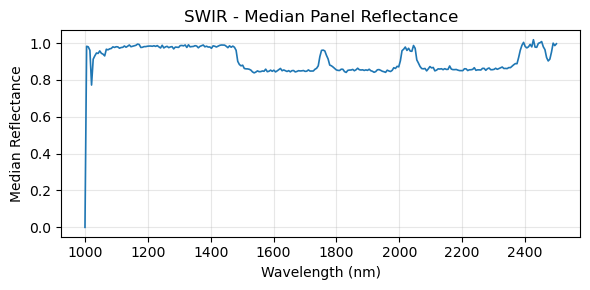

✅ Saved median panel reflectance CSV: Reorder_288_2334_384_U16_median_panel_reflectance.csv

🎨 SWIR Scene: 20241002113938 — Arboretum_test2 (10:33:55)
Preparing to write Reorder_288_2154_384_U16_reflectance.nc (shape=(384, 2154, 288))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_reflectance.nc (scaled int int16, compressed)


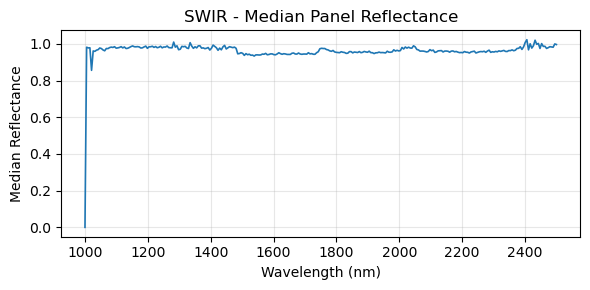

✅ Saved median panel reflectance CSV: Reorder_288_2154_384_U16_median_panel_reflectance.csv

📅 Processing Day Folder: 20250313

🎨 VNIR Scene: 20250313110542_SCN — 20250313_BFF_R_Gra_H_4_PRE_BED (10:09:07 AM)
Preparing to write reorder_272_1037_640_U16_reflectance.nc (shape=(640, 1037, 272))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313110542_SCN\reorder_272_1037_640_U16_reflectance.nc (scaled int int16, compressed)


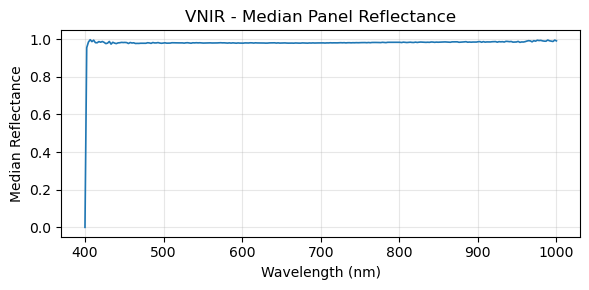

✅ Saved median panel reflectance CSV: reorder_272_1037_640_U16_median_panel_reflectance.csv

🎨 VNIR Scene: 20250313113110_SCN — 20250313_BFF_R_Gra_H_4_PRE (11:05:42 AM)
Preparing to write reorder_272_1037_640_U16_reflectance.nc (shape=(640, 1037, 272))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313113110_SCN\reorder_272_1037_640_U16_reflectance.nc (scaled int int16, compressed)


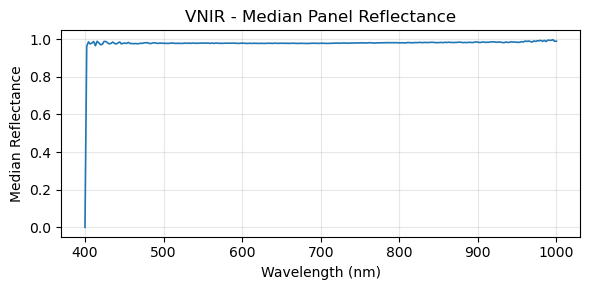

✅ Saved median panel reflectance CSV: reorder_272_1037_640_U16_median_panel_reflectance.csv

🎨 SWIR Scene: 20250313110542 — 20250313_BFF_R_Gra_H_4_PRE_BED (10:09:07 AM)
Preparing to write Reorder_288_1075_384_U16_reflectance.nc (shape=(384, 1075, 288))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313110542\Reorder_288_1075_384_U16_reflectance.nc (scaled int int16, compressed)


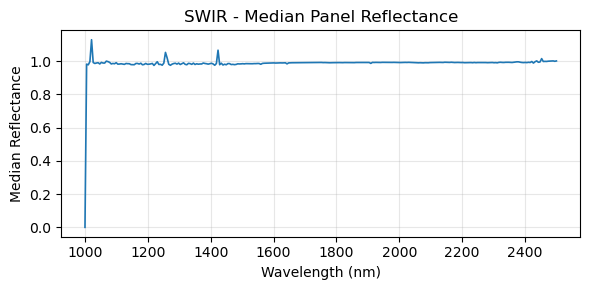

✅ Saved median panel reflectance CSV: Reorder_288_1075_384_U16_median_panel_reflectance.csv

🎨 SWIR Scene: 20250313113110 — 20250313_BFF_R_Gra_H_4_PRE (11:05:42 AM)
Preparing to write Reorder_288_1076_384_U16_reflectance.nc (shape=(384, 1076, 288))
✅ Wrote NetCDF: C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\SWIR\20250313113110\Reorder_288_1076_384_U16_reflectance.nc (scaled int int16, compressed)


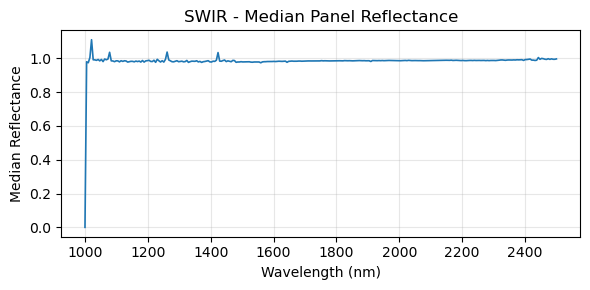

✅ Saved median panel reflectance CSV: Reorder_288_1076_384_U16_median_panel_reflectance.csv

🌍 All day folders processed (reflectance + metadata embedded).


In [2]:
# ============================================================
# Processing Cell 3 - Panel-based Reflectance Conversion Pipeline - VNIR & SWIR
# Plus metadata append (if exists) + original .bin path
# ============================================================
## This cell uses the detected panel regions and for both VNIR and SWIR, using the panel calibration file "LARGE_PANEL.txt"
## computes the median reflectance value for the panel region, saves this as a .csv, and processes the original datacube to a reflectance datacube.

## Note- for this cell to operate, it assumes a panel detection occurred in that folder. If it didn't there will obviously be no processed
## reflectance datacube. If panel detection has failed for a number of scans, the reflectance computation will need to be done in the next cell, 
## allowing oyu to specify the failed scan datacube, and supply a panel reflectance .csv to compute from.

## Also appednds scan metadata from "index.txt" and position information from "*_SolarCoords.txt" - if no metadata exists, writes base reflectance cube

import os
import re
import gc
import json
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from pathlib import Path
from collections import deque
from IPython.display import display, Image

# Import your pipeline helpers
import importlib
import panel_reflectance_pipeline as prp
importlib.reload(prp)
from panel_reflectance_pipeline import (
    import_datacube, visualise_panel_detection, select_informative_swir_wavelengths,
    robust_adaptive_threshold, ensure_python_numbers, normalise_for_detection,
    advanced_morphological_cleanup, _clip_bbox, map_vnir_to_swir_direct,
    build_expanded_search_box, extract_panel_subcube, visualise_swir_panel_overlay,
    read_detection_json, extract_panel_region, compute_calibration_coeff,
    normalise_cube_to_panel, quick_reflectance_plot
)

# ============================================================
# CONFIGURATION
# ============================================================
ROOT_DIR = Path.cwd()
VNIR_FOLDER = "Hyper"
SWIR_FOLDER = "SWIR"
METADATA_FOLDER = "MetaData"
INDEX_FILE = "Index.txt"
SOLAR_COORDS_PATTERN = "*SolarCoords.txt"
PANEL_CAL_FILE = ROOT_DIR / "LARGE_PANEL.txt"

REFLECTANCE_SCALE = 10000
INT_DTYPE = "int16"
FILL_VALUE = -999
COMPRESSION_LEVEL = 4
CHUNK_Y = 128
CHUNK_X = 128
VERBOSE = True

# ============================================================
# Utility functions
# ============================================================
def log(*args, **kwargs):
    if VERBOSE:
        print(*args, **kwargs)

def read_index_file(index_path: Path):
    entries = []
    try:
        with open(index_path, "r") as f:
            for line in f:
                line = line.strip()
                if not line or line.lower().startswith("index") or "-" in line:
                    continue
                parts = line.split(",", 1)
                if len(parts) == 2:
                    entries.append((parts[0].strip(), parts[1].strip()))
    except Exception as e:
        log(f"⚠️ Failed to read index file {index_path}: {e}")
    return entries

def read_solar_coords_file(path: Path) -> dict:
    data = {}
    raw_lines = []
    try:
        with open(path, "r") as f:
            for i, line in enumerate(f):
                if i > 5:
                    break
                raw = line.strip()
                if not raw:
                    continue
                raw_lines.append(raw)
                split_line = raw.replace(",", "=").replace("=", "=").split("=", 1)
                if len(split_line) == 2:
                    k = split_line[0].strip()
                    v = split_line[1].strip()
                    data[k] = v
        if raw_lines:
            data["__raw__"] = "\n".join(raw_lines)
    except Exception as e:
        log(f"⚠️ Could not read SolarCoords {path}: {e}")
    return data

def ddm_to_dd(ddm_str):
    if ddm_str is None:
        return None
    try:
        m = re.match(r"(-?\d+)'([\d.]+)\"", ddm_str)
        if not m:
            return None
        deg = float(m.group(1))
        mins = float(m.group(2))
        return deg + mins/60 if deg >= 0 else deg - mins/60
    except Exception:
        return None

# ============================================================
# Updated metadata function: add relative bin_file_path
# ============================================================
def add_metadata_to_dataset(ds: xr.Dataset, timestamp: str, label: str, solar_dict: dict,
                            bin_file_path: Path = None, root_dir: Path = None):
    """
    Add global metadata to an xarray Dataset (strings for attributes to avoid dtype issues).
    Includes optional relative path to the original .bin file.
    """
    ds.attrs["acquisition_time"] = str(timestamp)
    ds.attrs["scene_label"] = str(label)
    ds.attrs["metadata_added"] = "True"
    ds.attrs["metadata_source"] = f"{METADATA_FOLDER}/{INDEX_FILE}"

    if solar_dict:
        for k, v in solar_dict.items():
            if k == "__raw__":
                continue
            try:
                ds.attrs[str(k)] = str(v)
            except Exception:
                ds.attrs[str(k)] = json.dumps(v)
        if "__raw__" in solar_dict:
            ds.attrs["position_raw"] = solar_dict["__raw__"]
        lon_dd = ddm_to_dd(solar_dict.get("Longitude")) if solar_dict else None
        lat_dd = ddm_to_dd(solar_dict.get("Latitude")) if solar_dict else None
        if lon_dd is not None:
            ds.attrs["longitude_dd"] = float(lon_dd)
        if lat_dd is not None:
            ds.attrs["latitude_dd"] = float(lat_dd)

    # --- Store relative .bin path ---
    if bin_file_path:
        try:
            if root_dir:
                ds.attrs["bin_file_path"] = str(bin_file_path.relative_to(root_dir))
            else:
                ds.attrs["bin_file_path"] = str(bin_file_path)
        except ValueError:
            # fallback if relative path fails
            ds.attrs["bin_file_path"] = str(bin_file_path)


# ============================================================
# Updated save function
# ============================================================
def save_reflectance_netcdf(
    reflectance_cube: np.ndarray,
    wavelengths: np.ndarray,
    timestamp: str,
    label: str,
    solar_dict: dict,
    save_path: Path,
    bin_file_path: Path = None,
    root_dir: Path = None,
    chunksize_y: int = CHUNK_Y,
    chunksize_x: int = CHUNK_X,
    scale_factor: int = REFLECTANCE_SCALE,
    dtype: str = INT_DTYPE,
    fill_value: int = FILL_VALUE,
    compress_level: int = COMPRESSION_LEVEL
):
    """
    Save a reflectance cube as a scaled int NetCDF with compression and CF metadata.
    Stores bin_file_path relative to ROOT_DIR if possible.
    """
    try:
        if reflectance_cube is None:
            log("⚠️ No reflectance cube provided.")
            return

        log(f"Preparing to write {save_path.name} (shape={reflectance_cube.shape})")

        # Scale & cast
        scaled = np.round(reflectance_cube * scale_factor).astype(np.int16)

        # Build xarray dataset
        ds = xr.Dataset(
            {"reflectance": (("y", "x", "wavelength"), scaled)},
            coords={"wavelength": wavelengths}
        )

        # Add variable-level CF metadata
        ds["reflectance"].attrs.update({
            "scale_factor": 1.0 / float(scale_factor),
            "add_offset": 0.0,
            "units": "reflectance",
            "_FillValue": int(fill_value),
            "long_name": f"{label} reflectance (scaled by {scale_factor})"
        })

        # Global metadata including relative bin path
        add_metadata_to_dataset(ds, timestamp, label, solar_dict,
                                bin_file_path=bin_file_path, root_dir=root_dir)

        # Encoding for compression + dtype + chunking
        comp = dict(zlib=True, complevel=int(compress_level))
        encoding = {
            "reflectance": {
                "dtype": dtype,
                "chunksizes": (chunksize_y, chunksize_x, len(wavelengths)),
                **comp
            }
        }

        ds.to_netcdf(save_path, format="NETCDF4", encoding=encoding)
        log(f"✅ Wrote NetCDF: {save_path} (scaled int {dtype}, compressed)")

        # Free memory
        del ds, scaled
        gc.collect()

    except Exception as e:
        log(f"⚠️ Failed to save {save_path}: {e}")

# ============================================================
# High-level day folder processing
# ============================================================
def process_day_folder_to_reflectance(day_folder: Path):
    log(f"\n📅 Processing Day Folder: {day_folder.name}")

    meta_folder = day_folder / METADATA_FOLDER
    index_path = meta_folder / INDEX_FILE
    if not index_path.exists():
        log(f"⚠️ No {INDEX_FILE} in {meta_folder}; skipping day.")
        return

    entries = read_index_file(index_path)
    if not entries:
        log(f"⚠️ No valid entries in {index_path}; skipping day.")
        return

    solar_files = list(meta_folder.glob(SOLAR_COORDS_PATTERN))
    solar_dict = read_solar_coords_file(solar_files[0]) if solar_files else {}

    # --- VNIR ---
    vnir_base = day_folder / VNIR_FOLDER
    if vnir_base.exists():
        vnir_scan_folders = sorted([p for p in vnir_base.iterdir() if p.is_dir() and p.name.upper().endswith("_SCN")])
        for idx, subdir in enumerate(vnir_scan_folders):
            if idx >= len(entries):
                break
            timestamp, label = entries[idx]
            vnir_json = next(subdir.glob("*_vnir_bbox.json"), None)
            if not vnir_json:
                log(f"⚠️ No VNIR panel JSON in {subdir.name}; skipping.")
                continue
            vnir_bin, bbox_vnir, _, _ = read_detection_json(vnir_json)
            if not vnir_bin.exists():
                log(f"⚠️ VNIR .bin missing for {subdir.name}; skipping.")
                continue

            log(f"\n🎨 VNIR Scene: {subdir.name} — {label} ({timestamp})")
            cube, wavelengths = import_datacube(vnir_bin, verify_orientation=False)
            panel = extract_panel_region(cube, bbox_vnir)
            cal_coeff = compute_calibration_coeff(panel, panel_cal_data)
            reflectance_cube = normalise_cube_to_panel(cube, cal_coeff)

            save_path = vnir_bin.with_name(vnir_bin.stem + "_reflectance.nc")
            save_reflectance_netcdf(
                reflectance_cube=reflectance_cube,
                wavelengths=wavelengths,
                timestamp=timestamp,
                label=label,
                solar_dict=solar_dict,
                save_path=save_path,
                bin_file_path=vnir_bin,    # <--- pass the original .bin
                root_dir=ROOT_DIR          # <--- used to compute relative path
            )


            csv_path = vnir_bin.with_name(vnir_bin.stem + "_median_panel_reflectance.csv")
            quick_reflectance_plot(
                wavelengths,
                reflectance_cube[bbox_vnir[1]:bbox_vnir[3]+1, bbox_vnir[0]:bbox_vnir[2]+1, :].mean(axis=(0,1)),
                "VNIR",
                save_csv_path=csv_path
            )

            del cube, panel, reflectance_cube
            gc.collect()

    # --- SWIR ---
    swir_base = day_folder / SWIR_FOLDER
    if swir_base.exists():
        swir_scan_folders = sorted([p for p in swir_base.iterdir() if p.is_dir()])
        for idx, subdir in enumerate(swir_scan_folders):
            if idx >= len(entries):
                break
            timestamp, label = entries[idx]
            swir_json = next(subdir.glob("*_swir_local_subcube.json"), None)
            if not swir_json:
                log(f"⚠️ No SWIR JSON in {subdir.name}; skipping.")
                continue
            swir_bin, bbox_swir, _, _ = read_detection_json(swir_json)
            if not swir_bin.exists():
                log(f"⚠️ SWIR .bin missing for {subdir.name}; skipping.")
                continue

            log(f"\n🎨 SWIR Scene: {subdir.name} — {label} ({timestamp})")
            cube, wavelengths = import_datacube(swir_bin, verify_orientation=False)
            panel = extract_panel_region(cube, bbox_swir)
            cal_coeff = compute_calibration_coeff(panel, panel_cal_data)
            reflectance_cube = normalise_cube_to_panel(cube, cal_coeff)

            save_path = swir_bin.with_name(swir_bin.stem + "_reflectance.nc")
            save_reflectance_netcdf(
                reflectance_cube=reflectance_cube,
                wavelengths=wavelengths,
                timestamp=timestamp,
                label=label,
                solar_dict=solar_dict,
                save_path=save_path,
                bin_file_path=swir_bin,
                root_dir=ROOT_DIR
            )

            csv_path = swir_bin.with_name(swir_bin.stem + "_median_panel_reflectance.csv")
            quick_reflectance_plot(
                wavelengths,
                reflectance_cube[bbox_swir[1]:bbox_swir[3]+1, bbox_swir[0]:bbox_swir[2]+1, :].mean(axis=(0,1)),
                "SWIR",
                save_csv_path=csv_path
            )

            del cube, panel, reflectance_cube
            gc.collect()

# ============================================================
# Run batch
# ============================================================
try:
    panel_cal_data = pd.read_csv(PANEL_CAL_FILE, sep="\t", header=None, names=["wavelength", "value"])
    log(f"✅ Loaded panel calibration: {PANEL_CAL_FILE.name} ({len(panel_cal_data)} wavelengths)")
except Exception as e:
    raise RuntimeError(f"Failed to load panel calibration file {PANEL_CAL_FILE}: {e}")

day_folders = sorted([p for p in ROOT_DIR.iterdir() if p.is_dir() and p.name.isdigit()])
log(f"Found {len(day_folders)} day folders to process.")

for day in day_folders:
    process_day_folder_to_reflectance(day)

log("\n🌍 All day folders processed (reflectance + metadata embedded).")

# NOTE:
# If error like 191: RuntimeWarning: invalid value encountered in cast scaled = np.round(reflectance_cube * scale_factor).astype(np.int16)
# This can safely be ignored, NaN's are handled by setting -999 in conversion

⚠️ Found 4 failed cube(s):

    C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313110542_SCN\reorder_272_1037_640_U16.bin
    C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313110542_SCN\reorder_272_1037_640_U16.bin
    C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313113110_SCN\reorder_272_1037_640_U16.bin
    C:\Users\eric\Documents\Spectro_Auto_latest_V\20250313\Hyper\20250313113110_SCN\reorder_272_1037_640_U16.bin

🧩 Processing recovery for cube: reorder_272_2295_640_U16.bin
   Using reference reflectance: reorder_272_2125_640_U16_median_panel_reflectance.csv
   Loaded cube shape: (640, 2295, 272)
✅ Saved reflectance cube: reorder_272_2295_640_U16_reflectance_recovered.nc
✅ Saved recovered reflectance cube → reorder_272_2295_640_U16_reflectance_recovered.nc


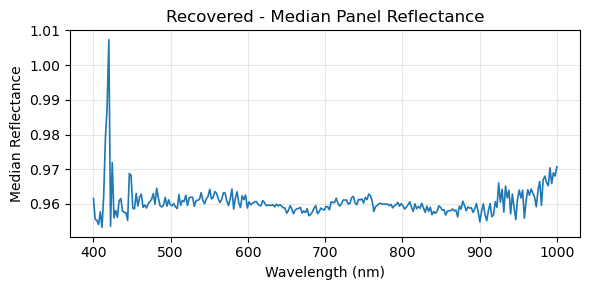

✅ Saved median panel reflectance CSV: reorder_272_2295_640_U16_reflectance_recovered_qa.csv
   QA CSV saved → reorder_272_2295_640_U16_reflectance_recovered_qa.csv

🧩 Processing recovery for cube: Reorder_288_2334_384_U16.bin
   Using reference reflectance: Reorder_288_2154_384_U16_median_panel_reflectance.csv
   Loaded cube shape: (384, 2334, 288)
✅ Saved reflectance cube: Reorder_288_2334_384_U16_reflectance_recovered.nc
✅ Saved recovered reflectance cube → Reorder_288_2334_384_U16_reflectance_recovered.nc


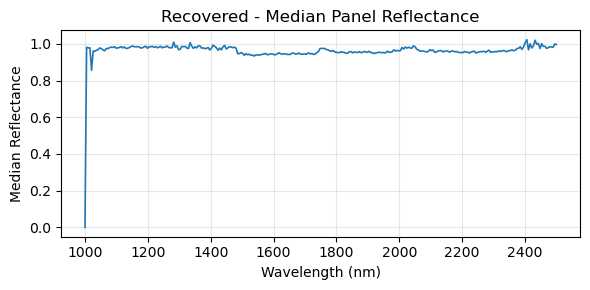

✅ Saved median panel reflectance CSV: Reorder_288_2334_384_U16_reflectance_recovered_qa.csv
   QA CSV saved → Reorder_288_2334_384_U16_reflectance_recovered_qa.csv

🌈 Manual recovery complete. Update the above paths to process other failed cubes.


In [6]:
# ============================================================
# Processing Cell 4 - Panel Detection Recovery Workflow (Manual Reflectance Assignment)
# ============================================================
## **NOTE - manually generating a reflectance cube this way will not auto-append metadata**
## This cell exists as a catch for failed panel detection files.
## It reads the error report (.txt) to show which files need to have a panel region applied and allows
## the use of an adjacent scan (that had successful panel detection) to use that reflectance median for either VNIR / SWIR
## and apply datacube reflectance conversion based on the supplied reflectance panel data.

## You will need to manually add the path to the datacube that needs its reflectance converted, and also a valid panel reflectance median file (csv)

import numpy as np
import pandas as pd
from pathlib import Path
import xarray as xr
import importlib
import panel_reflectance_pipeline as prp
importlib.reload(prp)
from panel_reflectance_pipeline import (
    import_datacube,
    export_reflectance_netcdf,
    quick_reflectance_plot
)

# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------
ROOT_DIR = Path.cwd()
ERROR_REPORT = ROOT_DIR / "pipeline_error_report.txt"

# ------------------------------------------------------------
# Step 1️⃣ — Parse failed cube paths from error report
# ------------------------------------------------------------
def parse_failed_cubes(error_file):
    """Parse the pipeline_error_report.txt file to extract file paths of failed cubes."""
    failed_files = []
    with open(error_file, "r") as f:
        for line in f:
            line = line.strip()
            if line.lower().startswith("file:"):
                path = line.split(":", 1)[1].strip()
                failed_files.append(Path(path))
    return failed_files


if ERROR_REPORT.exists():
    failed_cubes = parse_failed_cubes(ERROR_REPORT)
    print(f"⚠️ Found {len(failed_cubes)} failed cube(s):\n")
    for fc in failed_cubes:
        print("   ", fc)
else:
    print("❌ No pipeline_error_report.txt found in the root directory.")
    failed_cubes = []

# ------------------------------------------------------------
# Step 2️⃣ — User-specified inputs for recovery
# ------------------------------------------------------------
# Dummy example paths — replace these in the notebook as needed
VNIR_CUBE_PATH = Path(
    r"C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002103354_SCN\reorder_272_2295_640_U16.bin")
VNIR_REFLECTANCE_CSV = Path(
    r"C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\Hyper\20241002113938_SCN\reorder_272_2125_640_U16_median_panel_reflectance.csv")

SWIR_CUBE_PATH = Path(
    r"C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16.bin")
SWIR_REFLECTANCE_CSV = Path(
    r"C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002113938\Reorder_288_2154_384_U16_median_panel_reflectance.csv")

# ------------------------------------------------------------
# Step 3️⃣ — Helper to apply supplied reflectance to full cube
# ------------------------------------------------------------
def apply_reference_reflectance(cube_path, reference_csv, save_suffix="_reflectance_recovered"):
    """
    Use a known panel reflectance curve to scale a radiance cube to reflectance.
    Assumes radiance proportionality, i.e., reflectance = radiance * scale factor.
    """
    if not cube_path.exists():
        print(f"❌ Cube not found: {cube_path}")
        return None
    if not reference_csv.exists():
        print(f"❌ Reference reflectance CSV not found: {reference_csv}")
        return None

    print(f"\n🧩 Processing recovery for cube: {cube_path.name}")
    print(f"   Using reference reflectance: {reference_csv.name}")

    # --- Import cube ---
    cube, wavelengths = import_datacube(cube_path, verify_orientation=False)
    print(f"   Loaded cube shape: {cube.shape}")

    # --- Load median panel reflectance from CSV ---
    ref_df = pd.read_csv(reference_csv)
    refl = ref_df.iloc[:, 1].values  # assume 2nd column is reflectance
    if len(refl) != cube.shape[2]:
        print(f"⚠️ Length mismatch: CSV has {len(refl)} bands, cube has {cube.shape[2]}.")
        refl = np.interp(np.arange(cube.shape[2]), np.linspace(0, cube.shape[2]-1, len(refl)), refl)

    # --- Normalise cube to reference reflectance ---
    # Simple scaling (assuming radiance input)
    cube_reflectance = cube / np.nanmax(cube) * np.nanmax(refl)

    # --- Export ---
    save_path = cube_path.with_name(cube_path.stem + f"{save_suffix}.nc")
    export_reflectance_netcdf(cube_reflectance, wavelengths, save_path)
    print(f"✅ Saved recovered reflectance cube → {save_path.name}")

    # --- QA Plot ---
    csv_save_path = cube_path.with_name(cube_path.stem + f"{save_suffix}_qa.csv")
    quick_reflectance_plot(wavelengths, refl, "Recovered", save_csv_path=csv_save_path)
    print(f"   QA CSV saved → {csv_save_path.name}")

    return save_path


# ------------------------------------------------------------
# Step 4️⃣ — Run recovery for VNIR & SWIR manually
# ------------------------------------------------------------
# (You can rerun this cell and update the file paths each time)
apply_reference_reflectance(VNIR_CUBE_PATH, VNIR_REFLECTANCE_CSV)
apply_reference_reflectance(SWIR_CUBE_PATH, SWIR_REFLECTANCE_CSV)

print("\n🌈 Manual recovery complete. Update the above paths to process other failed cubes.")


In [4]:
# ============================================================
# Processing Cell 5 - Interactive NetCDF Reflectance Cube Viewer (default 1550 nm)
# ============================================================
## This cell allows you to specify a netCDF reflectance cube to examine how it looks.
## Note - you will need ipywidgets for this to work with the sliders, otherwise it defaults to showing the image at 1550nm.

import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
from ipywidgets import interact, IntSlider
import numpy as np

# -----------------------
# Specify NetCDF file
# -----------------------
nc_path = Path(r"C:\Users\eric\Documents\Spectro_Auto_latest_V\20241002\SWIR\20241002103355\Reorder_288_2334_384_U16_reflectance.nc")
print(f"Loading NetCDF: {nc_path.name}")

# -----------------------
# Load NetCDF cube
# -----------------------
netcdf_reflectance_cube = xr.open_dataset(nc_path)
print(netcdf_reflectance_cube)

# Access the reflectance variable (shape: y, x, wavelength)
reflectance = netcdf_reflectance_cube["reflectance"]
wavelengths = reflectance["wavelength"].values
num_bands = reflectance.shape[2]
print(f"Cube shape (y, x, wavelength): {reflectance.shape}")

# -----------------------
# Find band closest to 1550 nm
# -----------------------
target_wvl = 1550
band_index_1550 = int(np.argmin(np.abs(wavelengths - target_wvl)))
print(f"Closest band to {target_wvl} nm: index {band_index_1550}, wavelength {wavelengths[band_index_1550]:.1f} nm")

# -----------------------
# Display a single band with interactive slider
# -----------------------
def show_band(band_index=band_index_1550):
    plt.figure(figsize=(8,6))
    plt.imshow(reflectance[:,:,band_index], cmap="gray", origin="upper")
    plt.title(f"Reflectance Cube - Band {band_index} (Wavelength {reflectance['wavelength'][band_index].values:.1f} nm)")
    plt.colorbar(label="Reflectance")
    plt.show()

band_slider = IntSlider(min=0, max=num_bands-1, step=1, value=band_index_1550, description="Band")
interact(show_band, band_index=band_slider)


Loading NetCDF: Reorder_288_2334_384_U16_reflectance.nc
<xarray.Dataset> Size: 2GB
Dimensions:      (y: 384, x: 2334, wavelength: 288)
Coordinates:
  * wavelength   (wavelength) float64 2kB 1e+03 1.005e+03 ... 2.495e+03 2.5e+03
Dimensions without coordinates: y, x
Data variables:
    reflectance  (y, x, wavelength) float64 2GB ...
Attributes:
    acquisition_time:                   10:26:31
    scene_label:                        Arboretum_test
    metadata_added:                     True
    metadata_source:                    MetaData/Index.txt
    Longitude:                          = 149'3.77"= Latitude == -35'18.17"= ...
    Maximum solar elevation (DD.d):     =58.0
    Time of maximum elevation (HH:mm):  =11:53
    Sunrise time (HH:mm):               =05:44
    Sunset time (HH:mm):                =18:03
    position_raw:                       Daily solar coordinates for 02 Octobe...
    bin_file_path:                      20241002\SWIR\20241002103355\Reorder_...
Cube shape (y, x,

interactive(children=(IntSlider(value=105, description='Band', max=287), Output()), _dom_classes=('widget-inte…

<function __main__.show_band(band_index=105)>